In [1]:
import scanpy as sc
import pandas as pd
from scipy import sparse
import anndata as ad

In [2]:
sc_chimp_all = sc.read_h5ad('/data/passala/Generated_Tables/chimp_human_data/chimp_data_cleaned_up.h5ad')
sc_human_all = sc.read_h5ad('/data/passala/Generated_Tables/chimp_human_data/human_data_cleaned_up.h5ad')

In [3]:
sc_chimp_only_10x = sc_chimp_all[sc_chimp_all.obs['tech'] == '10Xv3',:]
sc_chimp_only_10x

View of AnnData object with n_obs × n_vars = 109062 × 56954
    obs: 'final_subclass', 'final_cluster', 'final_subclass_color', 'final_cluster_color', 'species', 'tech'
    layers: 'counts'

In [4]:
sc_human_only_10x = sc_human_all[sc_human_all.obs['tech'].isin(['10Xv3','10xv3']),:]
sc_human_only_10x

View of AnnData object with n_obs × n_vars = 127002 × 50281
    obs: 'final_subclass', 'final_cluster', 'final_subclass_color', 'final_cluster_color', 'species', 'tech'
    layers: 'counts'

In [5]:
sc_human_all.obs['tech'].value_counts()

10Xv3      114564
NextGEM     13796
10xv3       12438
Name: tech, dtype: int64

In [6]:
sc_human_only_10x.var_names

Index(['3.8-1.2', '3.8-1.3', '3.8-1.4', '3.8-1.5', '5-HT3C2', 'A1BG',
       'A1BG-AS1', 'A1CF', 'A2M', 'A2M-AS1',
       ...
       'ZXDB', 'ZXDC', 'ZYG11A', 'ZYG11AP1', 'ZYG11B', 'ZYX', 'ZZEF1', 'ZZZ3',
       'bA255A11.4', 'bA395L14.12'],
      dtype='object', name='Gene', length=50281)

In [7]:
ortholog_map = pd.read_csv('/data/passala/Collaborator_Data/Allen_Brain_Data_and_Heart_for_CRUSH_testing/human_chimp_1_1_orthologs.csv', index_col= 0)
chimp_mapper = pd.read_csv('/data/CoCoCoNet/geneInfo/chimp_info.csv')
chimp_mapper = chimp_mapper[['GeneSymbol','OrthoID']]
human_mapper = pd.read_csv('/data/CoCoCoNet/geneInfo/human_info.csv')
human_mapper = human_mapper[['GeneSymbol','OrthoID']]


In [8]:
ortholog_map = ortholog_map.merge(right = chimp_mapper, left_on='chimp',right_on= 'OrthoID')
ortholog_map = ortholog_map.rename(columns={'GeneSymbol':'Chimp Gene'})
ortholog_map = ortholog_map.drop(columns= 'OrthoID')
ortholog_map = ortholog_map.merge(right = human_mapper, left_on='human',right_on= 'OrthoID')
ortholog_map = ortholog_map.rename(columns= {'GeneSymbol':'Human Gene'})
ortholog_map = ortholog_map[['Chimp Gene','Human Gene']]
ortholog_map

,Chimp Gene,Human Gene
0,ABHD12B,ABHD12B
1,NCK1,NCK1
2,LOC744176,ADH1C
3,RPUSD4,RPUSD4
4,BCKDHB,BCKDHB
...,...,...
16478,CRACR2B,CRACR2B
16479,OTULINL,OTULINL
16480,FBXO25,FBXO25
16481,FBN1,FBN1


In [9]:
human_genes_to_keep =sc_human_only_10x.var_names.intersection(ortholog_map['Human Gene'])
chimp_genes_to_keep = sc_chimp_only_10x.var_names.intersection(ortholog_map['Chimp Gene'])
ortholog_on_both = ortholog_map.loc[ortholog_map['Human Gene'].isin(human_genes_to_keep.to_list())]
ortholog_on_both = ortholog_on_both.loc[ortholog_on_both['Chimp Gene'].isin(chimp_genes_to_keep.to_list())]
one_to_one_present_in_single_cell = ortholog_on_both
one_to_one_present_in_single_cell

,Chimp Gene,Human Gene
0,ABHD12B,ABHD12B
1,NCK1,NCK1
3,RPUSD4,RPUSD4
4,BCKDHB,BCKDHB
6,RBMS1,RBMS1
...,...,...
16477,TUB,TUB
16478,CRACR2B,CRACR2B
16480,FBXO25,FBXO25
16481,FBN1,FBN1


In [10]:
one_to_one_present_in_single_cell = one_to_one_present_in_single_cell.drop_duplicates(subset= 'Human Gene', keep= False )
one_to_one_present_in_single_cell = one_to_one_present_in_single_cell.drop_duplicates(subset = 'Chimp Gene', keep = False)
one_to_one_present_in_single_cell

,Chimp Gene,Human Gene
0,ABHD12B,ABHD12B
1,NCK1,NCK1
3,RPUSD4,RPUSD4
4,BCKDHB,BCKDHB
6,RBMS1,RBMS1
...,...,...
16477,TUB,TUB
16478,CRACR2B,CRACR2B
16480,FBXO25,FBXO25
16481,FBN1,FBN1


In [11]:
human_vars_one_to_one = sc_human_only_10x.var.loc[sc_human_only_10x.var.index.isin(one_to_one_present_in_single_cell['Human Gene'])].index


In [12]:
sc_human_trimmed_to_one_to_one = sc_human_only_10x[:,human_vars_one_to_one]
sc_human_trimmed_to_one_to_one

View of AnnData object with n_obs × n_vars = 127002 × 15091
    obs: 'final_subclass', 'final_cluster', 'final_subclass_color', 'final_cluster_color', 'species', 'tech'
    layers: 'counts'

In [13]:
chimp_vars_one_to_one = sc_chimp_only_10x.var.loc[sc_chimp_only_10x.var.index.isin(one_to_one_present_in_single_cell['Chimp Gene'])].index


In [14]:
sc_chimp_trimmed_to_one_to_one = sc_chimp_only_10x[:,chimp_vars_one_to_one]
sc_chimp_trimmed_to_one_to_one

View of AnnData object with n_obs × n_vars = 109062 × 15091
    obs: 'final_subclass', 'final_cluster', 'final_subclass_color', 'final_cluster_color', 'species', 'tech'
    layers: 'counts'

In [15]:
sc_human_trimmed_to_one_to_one.var['Human Gene'] = sc_human_trimmed_to_one_to_one.var_names
sc_human_trimmed_to_one_to_one.var = sc_human_trimmed_to_one_to_one.var.merge(on = 'Human Gene', right = one_to_one_present_in_single_cell).set_index('Chimp Gene')

Trying to set attribute `.var` of view, copying.


In [16]:
order_of_vars = sc_chimp_trimmed_to_one_to_one.var.index.to_list()
current_order_human_vars = sc_human_trimmed_to_one_to_one.var_names
panda_version_of_human_x_data = pd.DataFrame(columns = current_order_human_vars, data = sc_human_trimmed_to_one_to_one.X.todense())

re_ordered_version = panda_version_of_human_x_data.reindex(columns = order_of_vars)
re_ordered_version = sparse.csr_matrix(re_ordered_version.values)
sc_human_trimmed_to_one_to_one.X = re_ordered_version
sc_human_trimmed_to_one_to_one.var = sc_human_trimmed_to_one_to_one.var.reindex(order_of_vars)

In [17]:
sc_chimp_trimmed_to_one_to_one.obs

,final_subclass,final_cluster,final_subclass_color,final_cluster_color,species,tech
CellID,,,,,,
AAACCCACATGAGAAT-1L8TX_190822_01_F11,Oligo,Oligo_1,#2E3E39,#003a28,chimp,10Xv3
AAACCCAGTGACTGAG-1L8TX_190822_01_F11,Oligo,Oligo_1,#2E3E39,#003a28,chimp,10Xv3
AAACCCATCCGTACGG-1L8TX_190822_01_F11,Micro-PVM,Micro-PVM_1,#94AF97,#6E7C6F,chimp,10Xv3
AAACGAAAGGCCTTGC-1L8TX_190822_01_F11,Oligo,Oligo_1,#2E3E39,#003a28,chimp,10Xv3
AAACGAATCATCGCTC-1L8TX_190822_01_F11,Astro,Astro_1,#665C47,#332F26,chimp,10Xv3
...,...,...,...,...,...,...
TTTGTTGGTATAGGAT-14L8TX_191217_01_C07,L2/3 IT,L2/3 IT_3,#C4EC04,#7cae24,chimp,10Xv3
TTTGTTGGTCTTTATC-14L8TX_191217_01_C07,L5 IT,L5 IT_8,#50B2AD,#00aba5,chimp,10Xv3
TTTGTTGGTTGGGTAG-14L8TX_191217_01_C07,L5 IT,L5 IT_1,#50B2AD,#48cbb9,chimp,10Xv3


In [18]:
sc_human_trimmed_to_one_to_one.X

<127002x15091 sparse matrix of type '<class 'numpy.float32'>'
	with 519560255 stored elements in Compressed Sparse Row format>

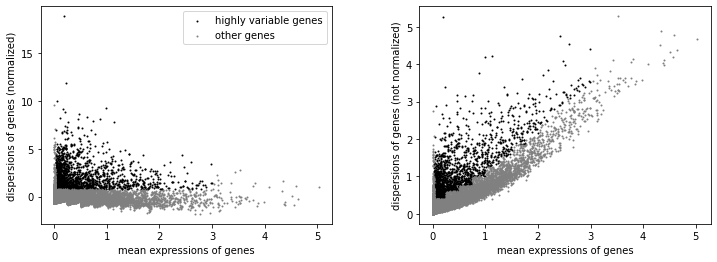

In [19]:
sc.pp.log1p(sc_human_trimmed_to_one_to_one)
sc.pp.highly_variable_genes(sc_human_trimmed_to_one_to_one, min_mean=0.025, max_mean=3, min_disp=0.75)
sc.pl.highly_variable_genes(sc_human_trimmed_to_one_to_one)

/home/passala/miniconda3/envs/py39/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:375: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


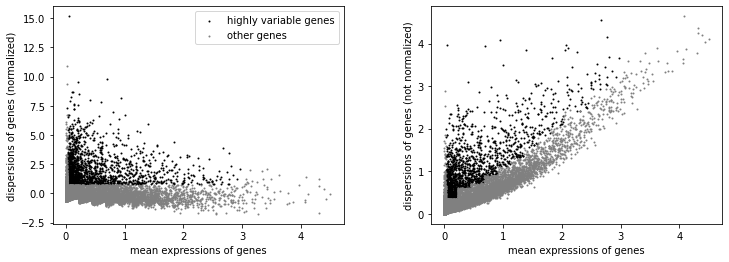

In [20]:
sc.pp.log1p(sc_chimp_trimmed_to_one_to_one)
sc.pp.highly_variable_genes(sc_chimp_trimmed_to_one_to_one, min_mean=0.025, max_mean=3, min_disp=0.75)
sc.pl.highly_variable_genes(sc_chimp_trimmed_to_one_to_one)


In [21]:
sc.tl.pca(sc_human_trimmed_to_one_to_one, svd_solver='arpack')
sc.pp.neighbors(sc_human_trimmed_to_one_to_one, n_neighbors= 10, n_pcs= 40)
sc.tl.umap(sc_human_trimmed_to_one_to_one)


In [22]:
color_list =list(set(sc_human_trimmed_to_one_to_one.obs['final_cluster_color'].to_list()))

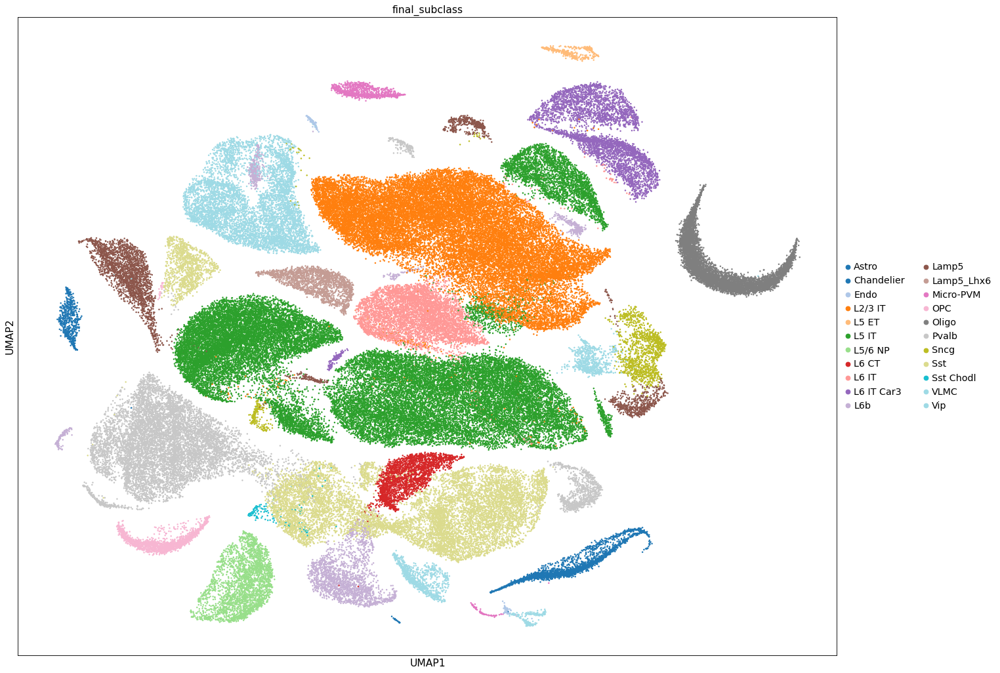

In [23]:
sc.set_figure_params(facecolor = 'white', figsize = (20,16))
sc.pl.umap(sc_human_trimmed_to_one_to_one, color=['final_subclass'], s =20, palette = 'tab20' )


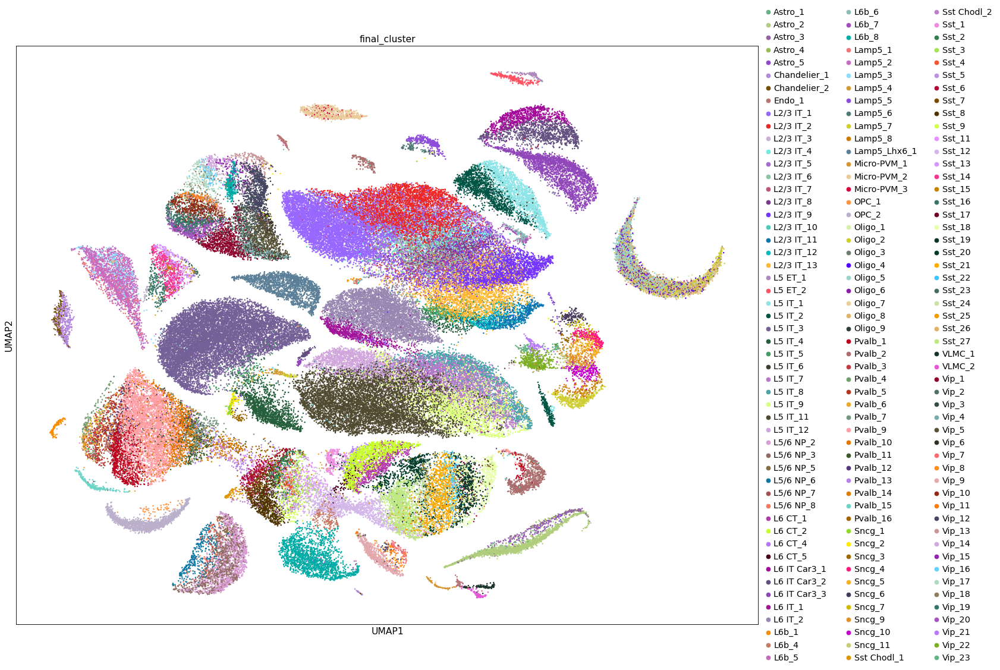

In [24]:
sc.pl.umap(sc_human_trimmed_to_one_to_one, color=['final_cluster'], s =20, palette = color_list)


In [25]:
sc.tl.pca(sc_chimp_trimmed_to_one_to_one, svd_solver='arpack')
sc.pp.neighbors(sc_chimp_trimmed_to_one_to_one, n_neighbors= 10, n_pcs= 40)
sc.tl.umap(sc_chimp_trimmed_to_one_to_one)


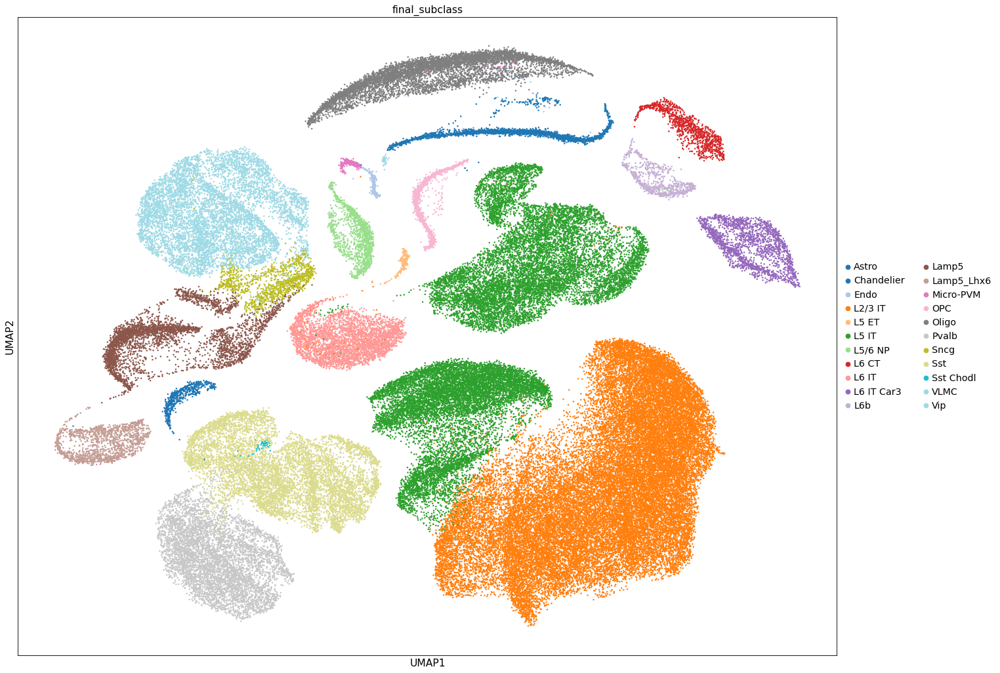

In [26]:
sc.pl.umap(sc_chimp_trimmed_to_one_to_one, color=['final_subclass'], s =20, palette = 'tab20' )


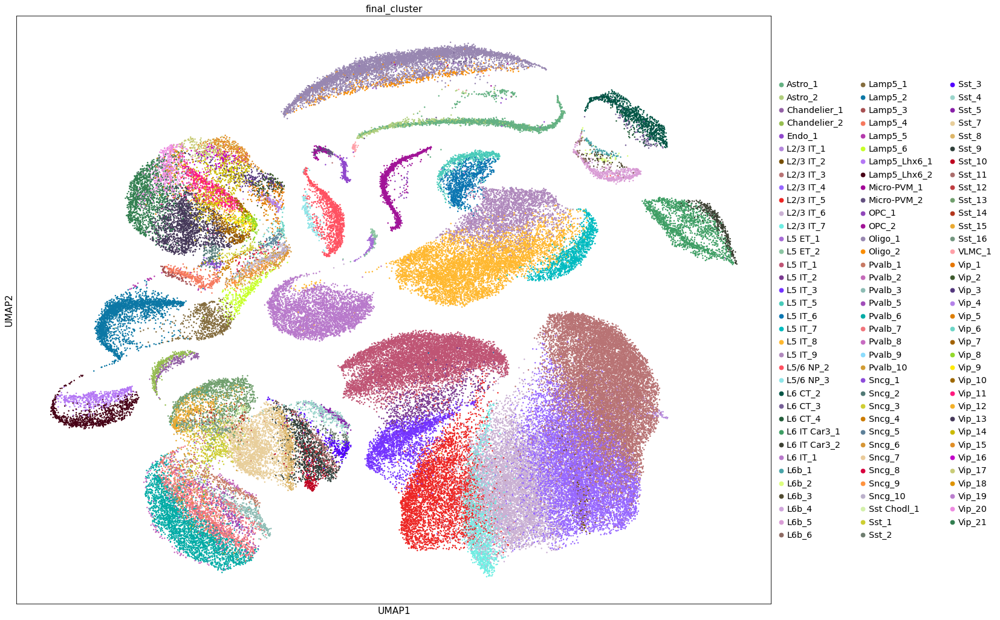

In [27]:
sc.pl.umap(sc_chimp_trimmed_to_one_to_one, color=['final_cluster'], s =20, palette = color_list)


In [28]:
naive_concat = sc_human_trimmed_to_one_to_one.concatenate(sc_chimp_trimmed_to_one_to_one)
naive_concat

AnnData object with n_obs × n_vars = 236064 × 15091
    obs: 'final_subclass', 'final_cluster', 'final_subclass_color', 'final_cluster_color', 'species', 'tech', 'batch'
    var: 'Human Gene-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts'

In [29]:
sc.tl.pca(naive_concat, svd_solver='arpack')
sc.pp.neighbors(naive_concat, n_neighbors= 10, n_pcs= 40)
sc.tl.umap(naive_concat)


/home/passala/miniconda3/envs/py39/lib/python3.9/site-packages/anndata-0.7.6-py3.9.egg/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'final_cluster' as categorical
/home/passala/miniconda3/envs/py39/lib/python3.9/site-packages/anndata-0.7.6-py3.9.egg/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'final_subclass_color' as categorical
/home/passala/miniconda3/envs/py39/lib/python3.9/site-packages/anndata-0.7.6-py3.9.egg/anndata/_core/anndata.py:1220: FutureWarning: The `inpla

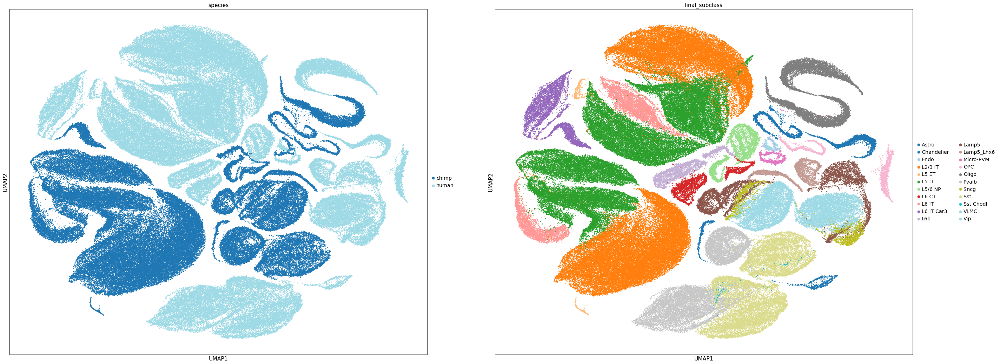

In [30]:
sc.pl.umap(naive_concat, color=['species','final_subclass'], s =20, palette = 'tab20' )


In [31]:
sc_human_trimmed_to_one_to_one.obs

,final_subclass,final_cluster,final_subclass_color,final_cluster_color,species,tech
CellID,,,,,,
AAACGAAAGCACTAAA-1LKTX_191204_01_A01,Astro,Astro_1,#665C47,#8D7C5D,human,10Xv3
AAAGGATTCAGGTGTT-1LKTX_191204_01_A01,Astro,Astro_2,#665C47,#4f492f,human,10Xv3
AAAGTGAAGGCGTTAG-1LKTX_191204_01_A01,Astro,Astro_2,#665C47,#4f492f,human,10Xv3
AAAGTGAAGGTAAGTT-1LKTX_191204_01_A01,Oligo,Oligo_5,#2E3E39,#1a3329,human,10Xv3
AAAGTGACACAGTCGC-1LKTX_191204_01_A01,Oligo,Oligo_3,#2E3E39,#387567,human,10Xv3
...,...,...,...,...,...,...
TTTGTTGAGTATAGAC-16LKTX_191204_02_H01,L2/3 IT,L2/3 IT_6,#C4EC04,#B0CE7C,human,10Xv3
TTTGTTGCATAATCGC-16LKTX_191204_02_H01,L2/3 IT,L2/3 IT_8,#C4EC04,#BEE880,human,10Xv3
TTTGTTGGTACGATGG-16LKTX_191204_02_H01,L2/3 IT,L2/3 IT_13,#C4EC04,#96BE50,human,10Xv3


[[0.         0.17377272]
 [0.         0.        ]]
Processing datasets human <=> chimp


/home/passala/miniconda3/envs/py39/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:260: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/home/passala/miniconda3/envs/py39/lib/python3.9/site-packages/anndata-0.7.6-py3.9.egg/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'final_cluster' as categorical
/home/passala/miniconda3/envs/py39/lib/python3.9/site-packages/anndata-0.7.6-py3.9.egg/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categor

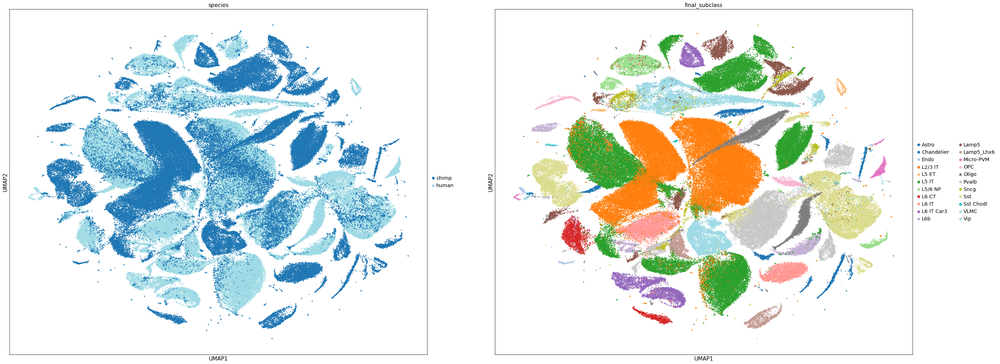

In [32]:

concatenated_human_chimp_for_scanorama = sc_human_trimmed_to_one_to_one.concatenate(sc_chimp_trimmed_to_one_to_one)
sc.external.pp.scanorama_integrate(concatenated_human_chimp_for_scanorama,'species')
sc.pp.neighbors(concatenated_human_chimp_for_scanorama, n_neighbors = 10, n_pcs = 40, use_rep= 'X_scanorama', random_state = 2204)
sc.tl.umap(concatenated_human_chimp_for_scanorama)
sc.pl.umap(concatenated_human_chimp_for_scanorama, color= ['species', 'final_subclass'], s = 20, palette = 'tab20')